# <center> Project 2 </center>

### Group Members
João Alberto Moreira Seródio - RA: 218548<br>
Rodolfo Luis Tonoli - RA: 105652<br>
Daniel Godoy Marques - RA:  166213<br>



# Introduction

This project presents an implementation of a genetic algorithm to maximize the profits (or minimize the losses) in the game Banco Imobiliário - a Brazilian version of Monopoly. Monopoly is one of the most well-known board games in the world and has been used to teach [accounting](https://clutejournals.com/index.php/TLC/article/view/1525) [1], [lodging development](https://www.tandfonline.com/doi/abs/10.1080/10963758.2010.10696983?casa_token=73XXHBDFOJEAAAAA:8X3wWEnk5GXU5pSYX8puUY5v3M2ZJa_brBnwgldRnEKO_bxX8b5lS9LZXqCHUSERppJUPdX6cGFm) [2], and even [English vocabulary](https://journal.unnes.ac.id/sju/index.php/eej/article/view/6669) [3].

Some researchers have studied negotiation strategies in Monopoly, such as [Loffredo](https://ieeexplore.ieee.org/abstract/document/1013210?casa_token=Vm9jWlJnFI4AAAAA:_TzJp9A7FxCGFNWoE1Tw-xZ9YarNZ8_EOmTG7ekyUeKApHBbfCSjN78imRci66pOa13f69aQuQ) [4] and [Yasumura et al.](https://www.tjhsst.edu/~rlatimer/techlab08/Book08/BookQ2Test3Feb29-08.pdf#page=82) [5]. [Hickey](https://www.businessinsider.com/math-monopoly-statistics-2013-6) [6] have also provided some insights on which properties to own based on the probability of other players landing on it. However, as far as we know, there is no research that investigates which properties a player should strive for in order to maximize its profits.

The present study uses a genetic algorithm to search for a combination of properties and houses that increases the profit in the Banco Imobiliário board game. 

For simplicity, we made several adjustments in the official rules of the game. Our model of the games is described as following:

*    There are 4 players in the game, but we focus on only one to maximize its profit (main player).
*    Only property spaces are taken into account, e.g., no jail and chance spaces (Sorte/Revés), thus landing on those spaces have no effect.
*    All properties are distributed at the beginning of the game. The main player chooses 7 properties and may place houses on those properties (the player can only place houses in a property if he has all the properties from the same group color).
*    We consider that the other players are smart, therefore: 
     1.    if the main player does not have any property from a given group color, all properties from that group will be owned by another player, and thus may receive a house;
     2. the other players will start placing houses on the property with the most expensive rent.


![Board](https://i.imgur.com/ryh9xXL.jpg)



# Implementation

First, we start by creating the class Property to store the properties information and the class Group to easily handle the group colors.

In [ ]:
import numpy as np
import random
from copy import deepcopy
import matplotlib.pyplot as plt

class Property:

  properties = []

  def __repr__(self):
    return "{}".format(self.number)

  def __init__(self, number, name, ptype, basecost, position, company_multiplier = None, rent = [], house_cost = None, color = None):
    #Card number/ID
    self.number = number
    self.name = name
    #Company or avenue/street
    self.ptype = ptype
    self.basecost = basecost
    #Position on the board (0 to 39)
    self.position = position
    if ptype == 'Companhia':
      self.company_multiplier = company_multiplier
    elif ptype == 'Imovel':
      #List with rent per house (rent[0] with no houses, rent[1] with 1 house, ..., rent[5] with 5 houses)
      self.rent = rent
      self.house_cost = house_cost
      #Class group and color to check if a house can be placed in a property
      self.group = color
      self.color = color.color
      self.group.properties.append(self)
    self.properties.append(self)
      
  @classmethod
  def get_n(cls, number):
    """Receives property number and returns the property"""
    for prop in cls.properties:
      if prop.number == number:
        return prop
    raise ValueError(str.format('%d is not a valid property number.' % number))

  @classmethod
  def get_pos(cls, position):
    """Receives position on the board and returns the property"""
    for prop in cls.properties:
      if prop.position == position:
        return prop
    raise ValueError(str.format('There is no property in position %d.' % position))


class Group:
  groups = []  
  def __init__(self, color):
    self.color = color
    self.properties = []
    self.groups.append(self)

  @classmethod
  def getGroups(cls):
    for group in cls.groups:
      yield group

  @classmethod
  def get(cls, color):
    """Receives color name and returns group"""
    for group in cls.groups:
      if group.color == color:
        return group

Group('pink')
Group('lightblue')
Group('purple')
Group('orange')
Group('red')
Group('yellow')
Group('green')
Group('blue')
Cards = []
Cards.append(Property(1, 'Leblon'                   , 'Imovel'    , 100, 1 , rent = [ 6, 30, 90, 270, 400, 500], house_cost = 50 , color = Group.get('pink')))
Cards.append(Property(2, 'Av. Presidente Vargas'    , 'Imovel'    , 60 , 3 , rent = [ 2, 10, 30,  90, 160, 250], house_cost = 50 , color = Group.get('pink')))
Cards.append(Property(3, 'Av. N. Sra. de Copacabana', 'Imovel'    , 60 , 4 , rent = [ 2, 10, 30,  90, 160, 250], house_cost = 50 , color = Group.get('pink')))
Cards.append(Property(4, 'Av. Brigadeiro Faria Lima', 'Imovel'    , 240, 6 , rent = [20,100,300, 750, 925,1100], house_cost = 150, color = Group.get('lightblue')))
Cards.append(Property(5, 'Av. Rebouças'             , 'Imovel'    , 220, 8 , rent = [18, 90,250, 700, 875,1050], house_cost = 150, color = Group.get('lightblue')))
Cards.append(Property(6, 'Av. 9 de Julho'           , 'Imovel'    , 220, 9 , rent = [18, 90,250, 700, 875,1050], house_cost = 150, color = Group.get('lightblue')))
Cards.append(Property(7, 'Av. Europa'               , 'Imovel'    , 200, 11, rent = [16, 80,220, 600, 800,1000], house_cost = 100, color = Group.get('purple')))
Cards.append(Property(8, 'Rua Augusta'              , 'Imovel'    , 180, 13, rent = [14, 70,200, 550, 750, 950], house_cost = 100, color = Group.get('purple')))
Cards.append(Property(9, 'Av. Pacaembu'             , 'Imovel'    , 180, 14, rent = [14, 70,200, 550, 750, 950], house_cost = 100, color = Group.get('purple')))
Cards.append(Property(10, 'Interlagos'              , 'Imovel'    , 350, 17, rent = [35,175,500,1100,1300,1500], house_cost = 200, color = Group.get('orange')))
Cards.append(Property(11, 'Morumbi'                 , 'Imovel'    , 400, 19, rent = [50,200,500,1400,1700,2000], house_cost = 200, color = Group.get('orange')))
Cards.append(Property(12, 'Flamengo'                , 'Imovel'    , 120, 21, rent = [ 8, 40,100, 300, 450, 600], house_cost = 50 , color = Group.get('red')))
Cards.append(Property(13, 'Botafogo'                , 'Imovel'    , 100, 23, rent = [ 6, 30, 90, 270, 400, 500], house_cost = 50 , color = Group.get('red')))
Cards.append(Property(14, 'Av. Brasil'              , 'Imovel'    , 160, 26, rent = [12, 60,180, 500, 700, 900], house_cost = 100, color = Group.get('yellow')))
Cards.append(Property(15, 'Av. Paulista'            , 'Imovel'    , 140, 28, rent = [10, 50,150, 450, 625, 750], house_cost = 100, color = Group.get('yellow')))
Cards.append(Property(16, 'Jardim Europa'           , 'Imovel'    , 140, 29, rent = [12, 60,180, 500, 700, 900], house_cost = 100, color = Group.get('yellow')))
Cards.append(Property(17, 'Copacabana'              , 'Imovel'    , 260, 31, rent = [22,110,330, 800, 975,1150], house_cost = 150, color = Group.get('green')))
Cards.append(Property(18, 'Av. Vieira Solto'        , 'Imovel'    , 320, 33, rent = [28,150,450,1000,1200,1400], house_cost = 200, color = Group.get('green')))
Cards.append(Property(19, 'Av. Atlântica'           , 'Imovel'    , 300, 34, rent = [26,130,390, 900,1100,1275], house_cost = 200, color = Group.get('green')))
Cards.append(Property(20, 'Ipanema'                 , 'Imovel'    , 300, 36, rent = [26,130,390, 900,1100,1275], house_cost = 200, color = Group.get('green')))
Cards.append(Property(21, 'Jardim Paulista'         , 'Imovel'    , 280, 38, rent = [24,120,360, 850,1025,1200], house_cost = 150, color = Group.get('blue')))
Cards.append(Property(22, 'Brooklin'                , 'Imovel'    , 260, 39, rent = [22,110,330, 800, 975,1150], house_cost = 150, color = Group.get('blue')))
Cards.append(Property(23, 'Ferroviaria'             , 'Companhia' , 200, 5 , company_multiplier = 50))
Cards.append(Property(24, 'Viacao'                  , 'Companhia' , 200, 7 , company_multiplier = 50))
Cards.append(Property(25, 'Taxi'                    , 'Companhia' , 150, 15, company_multiplier = 40))
Cards.append(Property(26, 'Navegacao'               , 'Companhia' , 150, 25, company_multiplier = 40))
Cards.append(Property(27, 'Aviacao'                 , 'Companhia' , 200, 32, company_multiplier = 50))
Cards.append(Property(28, 'Taxi Aereo'              , 'Companhia' , 200, 35, company_multiplier = 50))



The table shows some of the information on each property. When a player lands on a company owned by another player, he must pay an amount equals to the value of the dices times the company's multiplier, depicted in the last column of the table.

| Name                      | Number/id | Position | Base Cost | Rent (0 houses) | Rent (5 houses) | Multiplier |
|---------------------------|-----------|----------|-----------|-----------------|-----------------|-----------|
| Leblon                    | 1         | 1        | 100       | 6               | 500             |           |
| Av. Presidente Vargas     | 2         | 3        | 60        | 2               | 250             |           |
| Av. N. Sra. de Copacabana | 3         | 4        | 60        | 2               | 250             |           |
| Av. Brigadeiro Faria Lima | 4         | 6        | 240       | 20              | 1100            |           |
| Av. Rebouças              | 5         | 8        | 220       | 18              | 1050            |           |
| Av. 9 de Julho            | 6         | 9        | 220       | 18              | 1050            |           |
| Av. Europa                | 7         | 11       | 200       | 16              | 1000            |           |
| Rua Augusta               | 8         | 13       | 180       | 14              | 950             |           |
| Av. Pacaembu              | 9         | 14       | 180       | 14              | 950             |           |
| Interlagos                | 10        | 17       | 350       | 35              | 1500            |           |
| Morumbi                   | 11        | 19       | 400       | 50              | 2000            |           |
| Flamengo                  | 12        | 21       | 120       | 8               | 600             |           |
| Botafogo                  | 13        | 23       | 100       | 6               | 500             |           |
| Av. Brasil                | 14        | 26       | 160       | 12              | 900             |           |
| Av. Paulista              | 15        | 28       | 140       | 10              | 750             |           |
| Jardim Europa             | 16        | 29       | 140       | 12              | 900             |           |
| Copacabana                | 17        | 31       | 260       | 22              | 1150            |           |
| Av. Vieira Solto          | 18        | 33       | 320       | 28              | 1400            |           |
| Av. Atlântica             | 19        | 34       | 300       | 26              | 1275            |           |
| Ipanema                   | 20        | 36       | 300       | 26              | 1275            |           |
| Jardim Paulista           | 21        | 38       | 280       | 24              | 1200            |           |
| Brooklin                  | 22        | 39       | 260       | 22              | 1150            |           |
| Ferroviaria               | 23        | 5        | 200       |                 |                 | 50        |
| Viacao                    | 24        | 7        | 200       |                 |                 | 50        |
| Taxi                      | 25        | 15       | 150       |                 |                 | 40        |
| Navegacao                 | 26        | 25       | 150       |                 |                 | 40        |
| Aviacao                   | 27        | 32       | 200       |                 |                 | 50        |
| Taxi Aereo                | 28        | 35       | 200       |                 |                 | 50        |

## Evolutionary Model

Since we are looking for a combination of seven properties and some of those properties may receive houses, we adopted a chromosome with 14 genes. The first seven genes correspond to properties (identified by the property number/id), and the other seven genes correspond to the number of houses on those properties. Therefore, an individual in the population is represented as:

individual = [Property 1, Property 2, ..., Property 7, Houses in Property 1, Houses in Property 2, ..., Houses in Property 7]

## Fitness
The fitness function used to evaluate individuals takes into consideration the profits the main player will have based on its opponents' moves. Additionally, the function computes the cost to buy the properties and houses owned, and the player's moves, that is, the costs of landing on other players' properties. The moves are determined when the problem is created, and each player will perform 1000 moves with each move consisting of walking a number of spaces equal to the sum of 2 dices.


## Crossover
In order to create children based on the current population, the single point crossover method and double point crossover were used (separately). The population is sorted in a descending order based on each individual's fitness, then (Crossover_Rate x Population_Size) pairs are selected by running through the population list, which results in (Crossover_Rate x Population_Size) new individuals. Then, the (Crossover_Rate x Population_Size) pairs are randomly selected for another crossover, resulting in a total of (2 x Crossover_Rate x Population_Size) new individuals. The crossover is executed only on the property side of the chromosome as house distribution depends on the property cards the player has and will be done further. Therefore, all houses from the generated individuals are set to zero. Although this may seem a considerable drawback from performing crossover, we enforce that the number of houses that every player has must be equal. In other words, the player may "lose" his houses, but so does the other players (expect for the Increasing houses section from the Results, explained later).


## Mutation

At first, the mutation tries to add a house to a property randomly selected. If it cannot, the mutation will change a property; then, all houses will be set to zero. The mutation will fail to add a house if the player does not have all the properties from at least one group. It is not possible to build houses on company properties. The amount of mutations to be executed is  Mutation_Rate x Population_Size.
    

A second approach to mutation is made by setting the number of houses in a house that accepts houses randomly.


## Code

In [ ]:
class Player:
  def __init__(self, number, moves = [], money = 5000):
    self.number = number
    self.money = money
    self.properties = None
    self.moves = moves
    

class Problem:
  def __init__(self, game_cards, seed=True, overide_houses = 0):
    #self.fitness_threshold = fitness_threshold
    #self.max_generations = max_generations
    self.game_cards = game_cards
    self.population = []
    self.seed = seed
    self.overide_houses = overide_houses

    #Create players and their movements (fixed)
    n_moves = 1000
    dice = [1,2,3,4,5,6]
    players = []
    for player in range(4):
      #Roll two dices for each player n_moves times
      if self.seed:
        random.seed(player*2)
      dice1 = np.asarray(random.choices(dice, k=n_moves))
      if self.seed:
        random.seed(player*2+1)
      dice2 = np.asarray(random.choices(dice, k=n_moves))
      players.append(Player(player, moves = dice1+dice2))
    self.players = players
    #Get relevant positions of the board
    self.relevant_positions = [card.position for card in game_cards]
    
  def InitializePopulation(self, n):
    self.population = [] 
    cards = [card.number for card in self.game_cards]
    for chromossome in range(n):
      if self.seed:
        random.seed(chromossome)
      properties_n = sorted(random.sample(cards, 7))
      properties_for_houses_n = self.acceptsHouse(properties_n, returns='Number')
      houses = [0,0,0,0,0,0,0]
      if len(properties_for_houses_n) > 0:
        if self.seed:
          random.seed(chromossome)
        properties_for_houses_n = random.choices(properties_for_houses_n, k=random.choice(np.arange(1,len(properties_for_houses_n))))
        for prop_n in properties_for_houses_n:
          if self.seed:
            random.seed(chromossome)
          houses[properties_n.index(prop_n)] = random.choice(np.arange(6))
      #self.population.append(properties_n+houses)
      self.population.append([properties_n+houses,None])
    return self.population

  def Fitness(self, chromossome):
    cards_position = [Property.get_n(chromossome[i]).position for i in range(7)]
    balance = 0
    #Earnings from other players
    for player in self.players[1:]:
      current_position = 0
      for dice in player.moves:
        current_position += dice
        if current_position > 39:
          current_position -= 40
        if current_position in cards_position:
          index = cards_position.index(current_position)
          prop = Property.get_n(chromossome[index])
          if prop.ptype == 'Companhia':
            balance += prop.company_multiplier*dice
          else:
          #Get the rent of the property based on the number of houses on it (chromossome[6+index])
            balance += prop.rent[chromossome[7+index]]

    #Cost to buy properties and houses
    for index,prop in enumerate([Property.get_n(chromossome[i]) for i in range(7)]):
      balance -= prop.basecost
      if prop.ptype != 'Companhia':
        balance -= prop.house_cost*chromossome[7+index]

    #Cost to play
    if self.overide_houses:
      houses = self.overide_houses
    else:
      houses = sum(chromossome[7:])
      houses = 3*houses #Houses owned by other players
    other_properties = [prop.position for prop in self.game_cards if prop.ptype == 'Imovel' and prop.position not in cards_position] #Properties owned by other playes
    dic = {position: 0 for position in other_properties} #dictonary with key = position in the board, and value = number of houses
    other_properties = self.acceptsHouse(other_properties, input='Position', returns='Position') #Propertiers owned by other players that can receive house
    #Place houses in those properties (using the dictionary) from most expensive to cheapest
    other_properties = self.sortRent(other_properties, input='Position', returns='Position')
    while houses > 0 and len(other_properties) > 0:
      propertyforhouse = other_properties.pop()
      dic[propertyforhouse] = 5
      houses -= 5
    #print(chromossome)
    #print(dic)
    current_position = 0
    for dice in self.players[0].moves:
      current_position += dice
      if current_position > 39:
        current_position -= 39
      if current_position in self.relevant_positions and current_position not in cards_position:
        prop = Property.get_pos(current_position)
        if prop.ptype == 'Companhia':
          balance -= prop.company_multiplier*dice
        else:
        #Get the rent of the property based on the number of houses on it (chromossome[6+index])
          balance -= prop.rent[dic[current_position]]
    return balance


  def acceptsHouse(self, properties, input = 'Number', returns = 'Object'):
    if input=='Number':
      properties = [Property.get_n(prop) for prop in properties]
    elif input=='Position':
      properties = [Property.get_pos(prop) for prop in properties]
    properties = [prop for prop in properties if prop.ptype=='Imovel']
    groups = []
    for group in Group.getGroups():
      num = sum([1 for prop in properties if prop.group is group])
      if num == len(group.properties):
        groups.append(group.color)
    if returns == 'Object':
      return [prop for prop in properties if prop.color in groups]
    elif returns == 'Number':
      return [prop.number for prop in properties if prop.color in groups]
    elif returns == 'Position':
      return [prop.position for prop in properties if prop.color in groups]

  def sortPopulation(self, population = None):
    #Sort population by fitness
    if not population:
      population = self.population
    #Compute fitness if necessary
    for chromossome in population:
      if chromossome[1] == None:
        chromossome[1] = self.Fitness(chromossome[0])
    #Sort by fitness
    fitlist = [fit[1] for fit in population]
    indexes = sorted(range(len(fitlist)), key=fitlist.__getitem__)[::-1]
    return [population[i] for i in indexes], np.asarray([fitlist[i] for i in indexes])

  


  def Crossover(self, population=None, rate=0.8, cut=None, seed=None, method=1):
    #There are two crossovers: the first one reproduces the fittests among themselves, that is
    # number 1 with number 2, number 3 with number 4 and so on... rate*len(population) parents are selected for reproduction
    #The second one picks two parents radomly and reproduce them, again, rate*len(population) parents are selected for reproduction
    # The crossover removes all houses
    if not population:
      population = self.population

    if not cut:
      if seed:
        random.seed(seed)
      cut = random.choice(np.arange(1,6))
      if method == 2:
        cut = random.sample(range(7), 2)
        cut = np.sort(cut)
    new_population = []
    n = int(np.floor(rate*len(population)))
    aux_population,_ = self.sortPopulation(population) #DEVE PODER TIRAR DAQUI, JA ERA PRA ESTAR ORDENADA

    ##First crossover
    for i in range(0,n,2):
      if method == 1:
        new1 = sorted(aux_population[i][0][:cut] + aux_population[i+1][0][cut:7])
        new2 = sorted(aux_population[i+1][0][:cut] + aux_population[i][0][cut:7])
      else:
        new1 = sorted(aux_population[i][0][0:cut[0]] + aux_population[i+1][0][cut[0]:cut[1]] + aux_population[i][0][cut[1]:7])
        new2 = sorted(aux_population[i+1][0][0:cut[0]] + aux_population[i][0][cut[0]:cut[1]] + aux_population[i+1][0][cut[1]:7])
      new1.extend([0,0,0,0,0,0,0])
      new2.extend([0,0,0,0,0,0,0])
      new_population += [[new1,None], [new2,None]]

    #Second crossover
    if seed:
      random.seed(seed)
    indexes = random.sample(aux_population, n)
    i=0
    while i+1 < len(indexes):
    #for i in range(0,len(indexes),2):
      chromossome1 = indexes[i][0]
      chromossome2 = indexes[i+1][0]
      if method == 1:
        new1 = sorted(chromossome1[:cut] + chromossome2[cut:7])
        new2 = sorted(chromossome2[:cut] + chromossome1[cut:7])
      else:
        new1 = sorted(chromossome1[0:cut[0]] + chromossome2[cut[0]:cut[1]] + chromossome1[cut[1]:7])
        new2 = sorted(chromossome2[0:cut[0]] + chromossome1[cut[0]:cut[1]] + chromossome2[cut[1]:7])
      new1.extend([0,0,0,0,0,0,0])
      new2.extend([0,0,0,0,0,0,0])
      new_population += [[new1,None], [new2,None]]
      i += 2
    return new_population

  def Mutation(self, population=None, rate=0.5, seed=None, append=False, mutation_type=1):
    #At first, the mutation tries to add a house to a property. If it can't,
    #the mutation will change a property; then, all houses will be set to zero.
    #The mutation will fail to add a house if the player does not have all the 
    #properties from at least one group. It is not possible to build houses on
    #company properties (ptype=='Companhia')

    def changeProperty(new, mutation_type):
      new = new[:7]
      if seed:
        random.seed(seed)
      property_n = random.choice(np.arange(7))
      #new[property_n] += random.choice([1,-1])
      if seed:
        random.seed(seed)
      new[property_n] = random.choice(np.arange(28))+1
      if new[property_n] < 1:
        new[property_n] = 28
      elif new[property_n] > 28:
        new[property_n] = 1
      new=sorted(new)
      new.extend([0,0,0,0,0,0,0])
      addHouse(new, mutation_type)
      return new

    def addHouse(new, mutation_type):
      acceptshouse = self.acceptsHouse(new[:7], returns='Number')
      house_accepted = False
      if seed:
        random.seed(seed)
      random.shuffle(acceptshouse)
      while len(acceptshouse) > 0 and not house_accepted:
        property_n = acceptshouse.pop()
        house_index = 7+new.index(property_n)
        if new[house_index] < 5 and mutation_type == 1:
          new[house_index] += 1
          house_accepted = True
        if mutation_type == 2:
          new[house_index] = random.choice(np.arange(6))
          house_accepted = True
      return house_accepted

    if not population:
      population = self.population
    new_population= []
    n = int(np.floor(rate*len(population)))
    if seed:
      random.seed(seed)
    aux_population = random.sample(population, k=n)
    for chromossome in aux_population:
      new = deepcopy(chromossome[0])
      #If there are properties eligible for building houses, it will add house in one of them (random)
      house_accepted = addHouse(new, mutation_type)
      #If there are no properties allowed to add houses to, it will change a property
      if not house_accepted:
        new = changeProperty(new, mutation_type)
      new_population += [[new,None]]
    if append:
      return new_population + population
    return new_population


  def Selection(self, population, option=1):
    if option==1:
      return [population[0], population[1]]
    if option==2:
      fitness = [individual[1] for individual in population]
      minimun = np.abs(np.min(fitness))
      fitness = fitness + minimun
      sum_fit = np.sum(fitness)
      probability = [fit/sum_fit for fit in fitness]
      index = np.random.choice(np.arange(len(population)), 2, replace=False, p=probability)
      return [population[index[0]],population[index[1]]]

  def Search(self, max_generations=100, 
             reset_population=False, 
             mutation_rate = 0.5, 
             crossover_rate = 0.8, 
             overide_houses = 0, 
             selection_type = 1,
             crossover_type = 1,
             mutation_type = 1,
             replacement_type = 1,
             stop = True,
             toprint=True):
    avg_fitness = []
    max_fitness = []
    min_fitness = []
    fittest = []
    gen = 0
    if not self.population or reset_population:
      self.InitializePopulation(10)
    self.population, fitness = self.sortPopulation(self.population)
    #aux_population = deepcopy(self.population)
    avg_fitness.append(np.mean(fitness))
    max_fitness.append(np.max(fitness))
    min_fitness.append(np.min(fitness))
    while gen < max_generations:
      if toprint:
        print('Generation %d' %gen)
        print('Fitest 1: %s' % self.population[0])
        print('Fitest 2: %s' % self.population[1])
        print('Fitest 3: %s' % self.population[2])
      gen += 1

      if self.seed:
        seed = gen
      else:
        seed = None

      #Selection - returns two individuals
      new_population = self.Selection(self.population, option = selection_type)
      #Crossover - returns list with len = 2xlen(population)).
      new_population += self.Crossover(self.population, seed = seed, rate = crossover_rate, method = crossover_type)
      #Mutation - returns list with len = len(population))
      new_population += self.Mutation(new_population, seed = seed, rate = mutation_rate, mutation_type = mutation_type)

      #No duplicates AND length at least equal to initial population
      while True:
        new_population = self.removeDuplicates(new_population)
        new_population, fitness = self.sortPopulation(new_population)
        if len(new_population) >= len(self.population):
          break
        else:
          if seed:
            seed += 1
          new_population += self.Mutation(new_population, append=True, seed = seed)


      #Keeps the same size of the population
      if replacement_type == 1:
        if len(new_population) > len(self.population):
            new_population = new_population[:len(self.population)]
            fitness = fitness[:len(self.population)]
        self.population = deepcopy(new_population)
      elif replacement_type == 2:
        if len(new_population) > len(self.population):
            size = len(self.population)
            self.population = new_population[:int(0.8*size)]
            k = int(0.2*size)
            random_ones = random.choices(new_population[int(0.8*size):], k=k)
            self.population.extend(random_ones)


      #Stop criteria
      if gen > 10 and stop:
        if fitness[0] == np.mean(max_fitness[-10:]) or fitness[0] == np.min(fitness):
          break

      avg_fitness.append(np.mean(fitness))
      max_fitness.append(np.max(fitness))
      min_fitness.append(np.min(fitness))
      fittest.append(self.population[0][0])

      #Obsolete
      max_fit = 0
      max_ind = None
      for chromossome in self.population:
          if chromossome[1] > max_fit:
              max_ind = chromossome
              max_fit = chromossome[1]

    moves = []
    for player in self.players:
      moves.append(player.moves)
    return avg_fitness, max_fitness, min_fitness, max_ind, gen, moves, fittest

  def removeDuplicates(self, population = None):
    if not population:
      population = self.population
    population, fitness = self.sortPopulation(population)
    aux_population = deepcopy(population)
    for i,chromossome in enumerate(population):
      if len(set(chromossome[0][:7])) != 7: #Checks if all properties from an individual are different from each other
        aux_population.remove(chromossome)
      else: #Checks if there are equal individuals among the population (maybe it would be better to check for equal fitness first)
        for j,aux_chromossome in enumerate(population[i+1:]):
          if chromossome[0] == aux_chromossome[0]:
            aux_population.remove(chromossome)
            break
    return aux_population

  def sortRent(self, properties, input='Position', returns='Position'):
    #sort cards by rent (decreasing)
    if input=='Position':
      properties = [Property.get_pos(prop) for prop in properties]
    properties = [prop for prop in properties if prop.ptype=='Imovel']
    listrent = [prop.rent[-1] for prop in properties]
    indexes = sorted(range(len(listrent)), key=listrent.__getitem__)[::-1]
    if returns == 'Position':
      properties = [prop.position for prop in properties]
      return [properties[i] for i in indexes]

  def printPop(self,population = None):
    if not population:
      population = self.population
    for pop in population:
      print(pop)

  def debug(self, arg=None):
    #debug something
    print(self.population)
    result = self.Mutation(seed=1)
    print('Result:')
    #print(result)
    return(result)



#p1moves = np.asarray([np.random.choice(dice)+np.random.choice(dice) for _ in range(n_moves)])

# Results

## Example

It is possible to see below the advancement in the fitness value of the best individual through each generation in the first graph, which also presents the worst and the average fitness value of all individuals of the population.

The second graph presents the total number of occurrences of each board position during the game, which is well distributed with a small variation.

In the last graph, it is possible to observe the fittest individual in each generation.



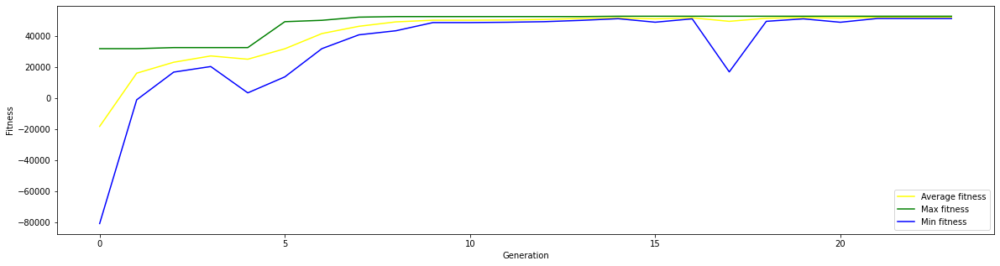

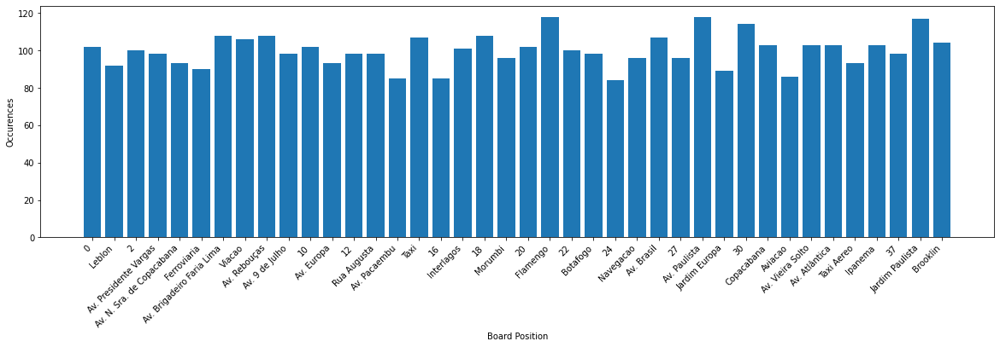

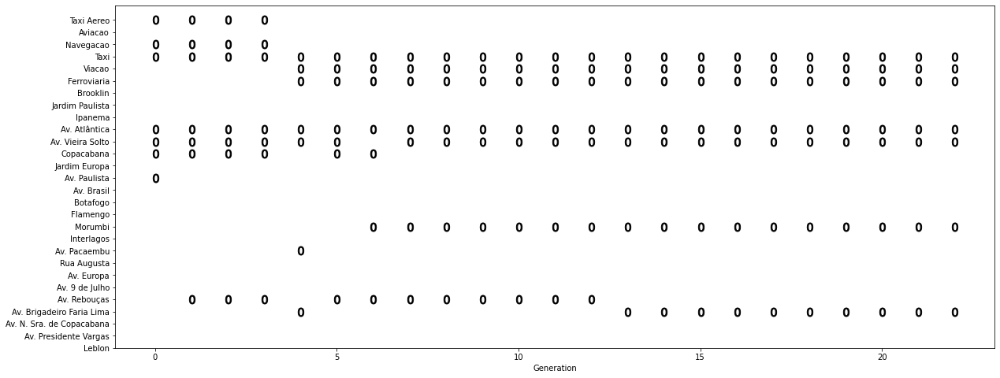

In [ ]:
problem = Problem(Cards)
problem.InitializePopulation(15)
avg_fitness, max_fitness, min_fitness, max_ind, gen, moves, fittests = problem.Search(max_generations=50, toprint=False)

fig = plt.figure(figsize =(20,5))
plt.plot(avg_fitness, color='yellow', label='Average fitness')
plt.plot(max_fitness, color='green', label='Max fitness')
plt.plot(min_fitness, color='blue', label='Min fitness')
plt.xlabel('Generation')
plt.ylabel('Fitness')
plt.legend()

dic_position = {position: 0 for position in np.arange(40)} 
for mov in moves:
  current_position = 0
  for dice in mov:
    current_position += dice
    if current_position > 39:
      current_position -= 40
    dic_position[current_position] += 1

fig = plt.figure(figsize =(20,5))
relevant_positions = sorted([card.position for card in Cards])
ticks_labels = [Property.get_pos(i).name if i in relevant_positions else str(i) for i in np.arange(40)]
plt.xticks(np.arange(0, 40, 1), ticks_labels, rotation=45, horizontalalignment='right')
plt.bar(list(dic_position.keys()), list(dic_position.values()), align='center')
plt.xlabel('Board Position')
plt.ylabel('Occurences')

fig = plt.figure(figsize =(20,8))
for i,fittest in enumerate(fittests):
  for j in range(7):
    marker = str.format('$%d$' % fittest[7+j])
    plt.scatter(i, fittest[j], color='black', marker=marker,s=120)
ticks_labels = [card.name for card in Cards]
plt.yticks(np.arange(1, 29, 1), ticks_labels)
_ = plt.xlabel('Generation')

## 20 Executions

In [ ]:
def printResults(resuts):
  fig = plt.figure(figsize =(20,8), dpi=500)
  fittests = [result[1] for result in results]
  max_fitest = [result[0] for result in results]
  pond_max_fitest = (np.asarray(max_fitest)*29/max(max_fitest))
  for i,fittest in enumerate(fittests):
    plt.bar(i, pond_max_fitest[i], align='center', color='blue', alpha=0.2)
    for j in range(7):
      marker = str.format('$%d$' % fittest[7+j])
      plt.scatter(i, fittest[j], color='black', marker=marker,s=120)
    plt.text(i, 1, 'Fitness:\n'+str(max_fitest[i]), horizontalalignment='center')
  ticks_labels = [card.name for card in Cards]
  plt.yticks(np.arange(1, 29, 1), ticks_labels, size='large')
  plt.xticks(np.arange(len(results)),labels = np.arange(len(results))+1)
  plt.grid(b=True, which='major', axis='y')
  plt.xlabel('Execution')

  print('Fitness: %.2f' % np.mean(max_fitest))
  gen = [result[2] for result in results]
  print('Generation: %.2f' % np.mean(gen))

Execution 0 finished in generation 22
Execution 1 finished in generation 24
Execution 2 finished in generation 29
Execution 3 finished in generation 20
Execution 4 finished in generation 33
Execution 5 finished in generation 21
Execution 6 finished in generation 11
Execution 7 finished in generation 24
Execution 8 finished in generation 37
Execution 9 finished in generation 32
Execution 10 finished in generation 39
Execution 11 finished in generation 35
Execution 12 finished in generation 24
Execution 13 finished in generation 41
Execution 14 finished in generation 17
Execution 15 finished in generation 34
Execution 16 finished in generation 20
Execution 17 finished in generation 36
Execution 18 finished in generation 42
Execution 19 finished in generation 46
Fitness: 176643.45
Generation: 29.35


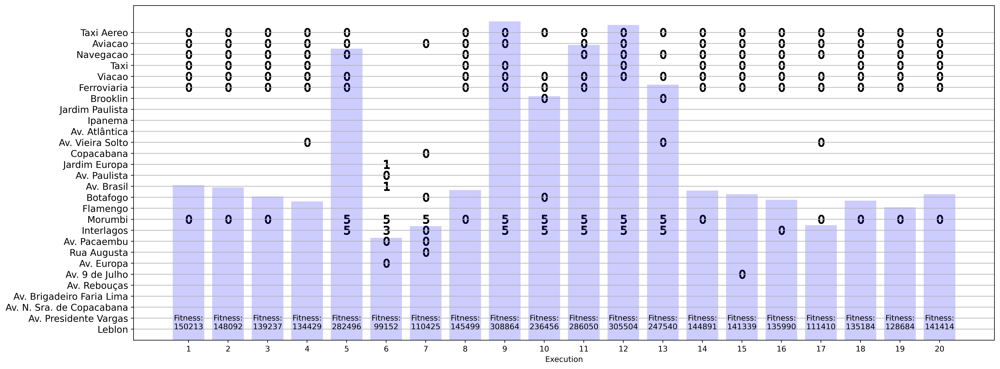

In [ ]:
results = []
for i in range(20):
  problem = Problem(Cards, seed=False)
  problem.InitializePopulation(10)
  avg_fitness, max_fitness, min_fitness, max_ind, gen, moves, fittests = problem.Search(max_generations=50, toprint=False)
  results.append( [max_fitness[-1], fittests[-1], gen] )
  print('Execution %d finished in generation %d' % (i, gen))
printResults(results)

## Increasing houses

Next, we will increase the houses owned by other players rather than impose the same amount of houses for the other players.

Execution 0 finished in generation 14
Execution 1 finished in generation 17
Execution 2 finished in generation 41
Execution 3 finished in generation 39
Execution 4 finished in generation 26
Execution 5 finished in generation 29
Execution 6 finished in generation 24
Execution 7 finished in generation 30
Execution 8 finished in generation 25
Execution 9 finished in generation 36
Execution 10 finished in generation 23
Execution 11 finished in generation 22
Execution 12 finished in generation 27
Execution 13 finished in generation 21
Execution 14 finished in generation 29
Execution 15 finished in generation 37
Execution 16 finished in generation 20
Execution 17 finished in generation 38
Execution 18 finished in generation 49
Execution 19 finished in generation 50
Fitness: 116367.40
Generation: 29.85


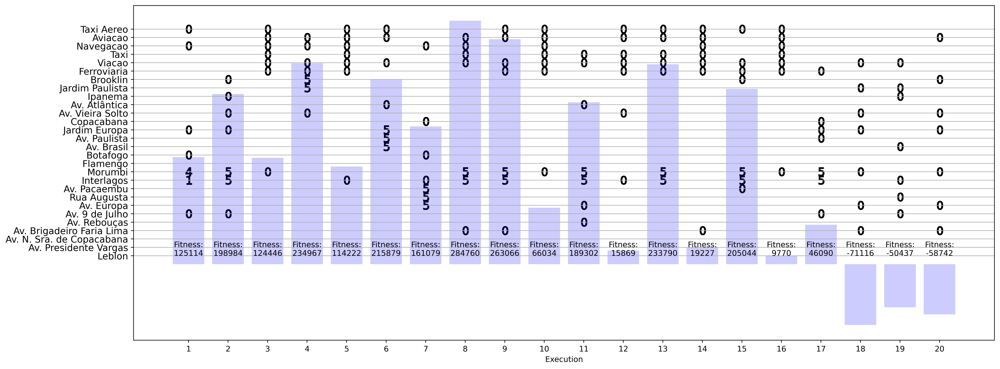

In [ ]:
results = []
for i in range(20):
  problem = Problem(Cards, seed=False, overide_houses=i*3)
  problem.InitializePopulation(10)
  avg_fitness, max_fitness, min_fitness, max_ind, gen, moves, fittests = problem.Search(max_generations=50, toprint=False)
  results.append( [max_fitness[-1], fittests[-1], gen] )
  print('Execution %d finished in generation %d' % (i, gen))
printResults(results)

At each execution, the number of houses owned by other players will increase by three. Therefore, in the first execution, there are no houses and, in the last one, 60 houses.

From the results, we notice that the algorithm usually converges to two local minimums: one containing most companies properties, and another that contains the properties with the most expensive rents in the game, Interlagos and Morumbi. 

However, in our tests, in the last executions, the algorithm takes a different approach. Instead of opting for one of the solutions mentioned before, the algorithm chooses to undermine the other players' game by owning only one card from different groups. That way, the players can not place houses on them. 

## Population Size

Execution 0 finished in generation 26
Execution 1 finished in generation 28
Execution 2 finished in generation 17
Execution 3 finished in generation 14
Execution 4 finished in generation 13
Execution 5 finished in generation 17
Execution 6 finished in generation 21
Execution 7 finished in generation 13
Execution 8 finished in generation 18
Execution 9 finished in generation 19
Fitness: 225337.20
Generation: 18.60


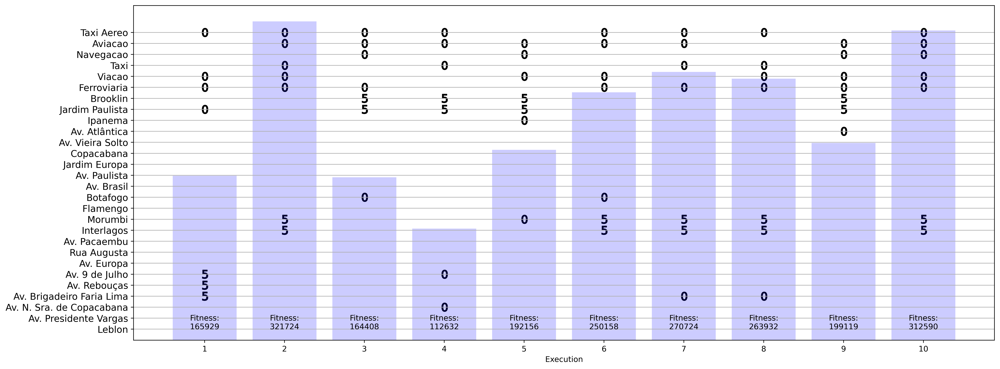

In [ ]:
results = []
for i in range(10):
  problem = Problem(Cards, seed=False)
  problem.InitializePopulation(10+i*10)
  avg_fitness, max_fitness, min_fitness, max_ind, gen, moves, fittests = problem.Search(max_generations=50, toprint=False, mutation_rate=0.8, crossover_rate=0.2)
  results.append( [max_fitness[-1], fittests[-1], gen] )
  print('Execution %d finished in generation %d' % (i, gen))
printResults(results)

Increasing the population size resulted in similar property distributions, even though they present different fitness values (set of moves is different but follows a similar distribution); the fittest individual always presents some companies (multiplier value and well distributed in the board), and Morumbi+Interlagos or Brooklyn+Jardim Paulista (two sets of properties that have the most expensive rents with 5 houses), which would consist on a good game strategy. Also, with more individuals in the population, the number of generations before stopping reduced slightly.

## Stop Criteria

With stop criteria
Execution 0 finished in generation 28
Execution 1 finished in generation 37
Execution 2 finished in generation 33
Execution 3 finished in generation 23
Execution 4 finished in generation 46
Execution 5 finished in generation 24
Execution 6 finished in generation 21
Execution 7 finished in generation 41
Execution 8 finished in generation 34
Execution 9 finished in generation 40
Fitness: 205877.60
Generation: 32.70
Without stop criteria (50 generations
Execution 0 finished in generation 50
Execution 1 finished in generation 50
Execution 2 finished in generation 50
Execution 3 finished in generation 50
Execution 4 finished in generation 50
Execution 5 finished in generation 50
Execution 6 finished in generation 50
Execution 7 finished in generation 50
Execution 8 finished in generation 50
Execution 9 finished in generation 50
Fitness: 209699.20
Generation: 50.00


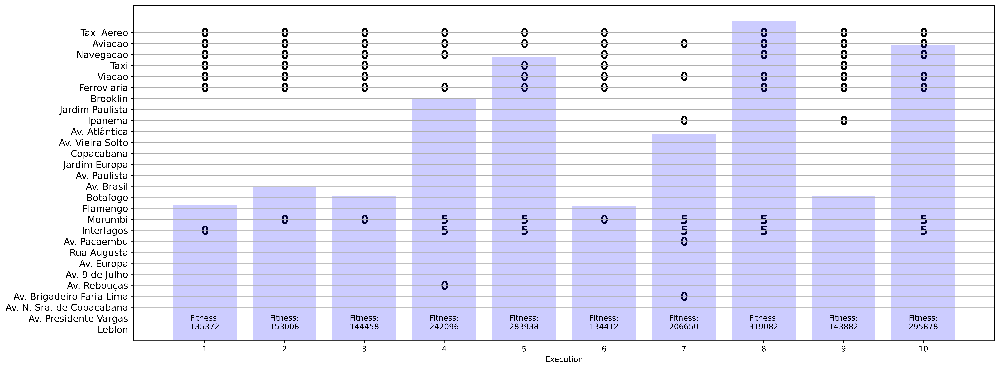

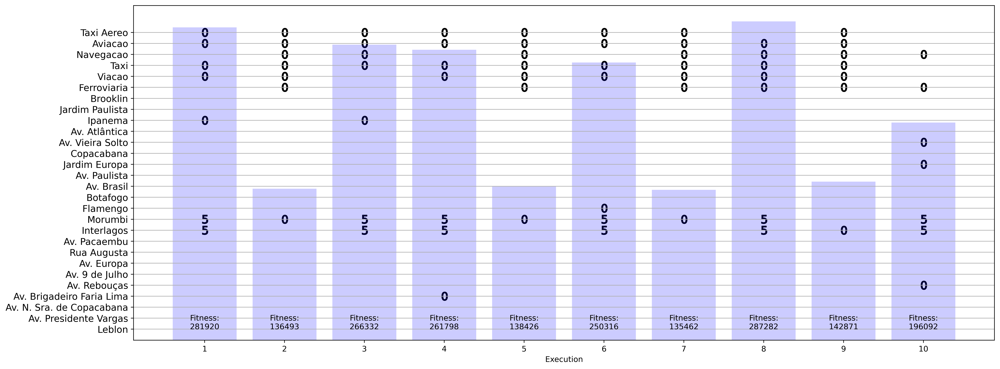

In [ ]:
print('With stop criteria')
results = []
for i in range(10):
  problem = Problem(Cards, seed=False)
  problem.InitializePopulation(10)
  avg_fitness, max_fitness, min_fitness, max_ind, gen, moves, fittests = problem.Search(max_generations=50, toprint=False, stop=True)
  results.append( [max_fitness[-1], fittests[-1], gen] )
  print('Execution %d finished in generation %d' % (i, gen))
printResults(results)

print('Without stop criteria (50 generations')
results = []
for i in range(10):
  problem = Problem(Cards, seed=False)
  problem.InitializePopulation(10)
  avg_fitness, max_fitness, min_fitness, max_ind, gen, moves, fittests = problem.Search(max_generations=50, toprint=False, stop=False)
  results.append( [max_fitness[-1], fittests[-1], gen] )
  print('Execution %d finished in generation %d' % (i, gen))

printResults(results)

We can observe that waiting for 50 generations (without a stop criteria) gives a better fitness on average, however, it is a negligible variation. Probably due to having the algorithm reaching convergence usually before 50 generations.

## Selection Technique

In this subsection, we study two different selection techiniques: elitism and roulette wheel, both selecting two individuals from the population. Elitism simply sorts the population and picks the best two individuals. The Roulette wheel has a chance of picking one individual based on its fitness. The probability $P$ of selecting and individual $h_i$ from a population with size $n$ is computed as:

$$ P(h_i) = \frac{F(h_i)+min}{\sum_{j=1}^{n}(F(h_j) + min)} $$

where $F$ is the Fitness function.

Individuals selected from both methods are still eligible for mutation.

With elitism selecting the top two fittest among he population
Execution 0 finished in generation 11
Execution 1 finished in generation 23
Execution 2 finished in generation 18
Execution 3 finished in generation 32
Execution 4 finished in generation 33
Execution 5 finished in generation 18
Execution 6 finished in generation 22
Execution 7 finished in generation 36
Execution 8 finished in generation 29
Execution 9 finished in generation 37
Fitness: 205974.70
Generation: 25.90
With roulette wheel selecting two among he population
Execution 0 finished in generation 50
Execution 1 finished in generation 32
Execution 2 finished in generation 50
Execution 3 finished in generation 50
Execution 4 finished in generation 40
Execution 5 finished in generation 32
Execution 6 finished in generation 33
Execution 7 finished in generation 50
Execution 8 finished in generation 50
Execution 9 finished in generation 20
Fitness: 125954.50
Generation: 40.70


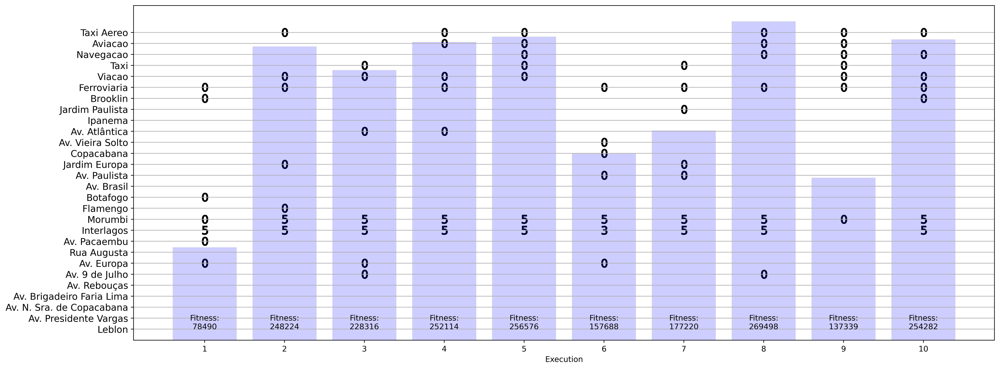

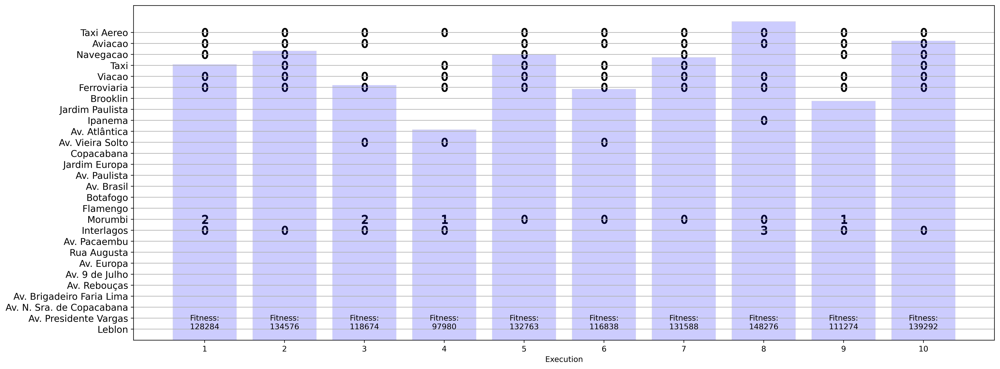

In [ ]:
#Elitism 
print('With elitism selecting the top two fittest among he population')
results = []
for i in range(10):
  problem = Problem(Cards, seed=False)
  problem.InitializePopulation(10)
  avg_fitness, max_fitness, min_fitness, max_ind, gen, moves, fittests = problem.Search(max_generations=50, toprint=False, selection_type=1)
  results.append( [max_fitness[-1], fittests[-1], gen] )
  print('Execution %d finished in generation %d' % (i, gen))
printResults(results)

#Roulette wheel
print('With roulette wheel selecting two among he population')
results = []
for i in range(10):
  problem = Problem(Cards, seed=False)
  problem.InitializePopulation(10)
  avg_fitness, max_fitness, min_fitness, max_ind, gen, moves, fittests = problem.Search(max_generations=50, toprint=False, selection_type=2)
  results.append( [max_fitness[-1], fittests[-1], gen] )
  print('Execution %d finished in generation %d' % (i, gen))
printResults(results)

After 10 executions, the mean result of maximum fitness for the elitism method was 205974.7, with 25.9 generations on average. On the other hand, the roulette wheel method obtained 125954.5 fitness, with 40.7 generations on average.

We noticed that elitism was able to have at least one property with 5 houses in 9 out of 10 results, while the roulette wheel obtained a maximum of 3 houses in only one result. We believe that the roulette wheel keeps losing the best results, and then the crossover dismantles them. Elitism was able to perform faster, with few generations, and achieve higher values of fitness.

## Crossover Technique

Single point crossover
Execution 0 finished in generation 28
Execution 1 finished in generation 42
Execution 2 finished in generation 34
Execution 3 finished in generation 50
Execution 4 finished in generation 15
Execution 5 finished in generation 41
Execution 6 finished in generation 24
Execution 7 finished in generation 42
Execution 8 finished in generation 38
Execution 9 finished in generation 36
Fitness: 239779.80
Generation: 35.00
Double point crossover
Execution 0 finished in generation 21
Execution 1 finished in generation 36
Execution 2 finished in generation 16
Execution 3 finished in generation 25
Execution 4 finished in generation 33
Execution 5 finished in generation 43
Execution 6 finished in generation 28
Execution 7 finished in generation 33
Execution 8 finished in generation 38
Execution 9 finished in generation 50
Fitness: 223092.60
Generation: 32.30


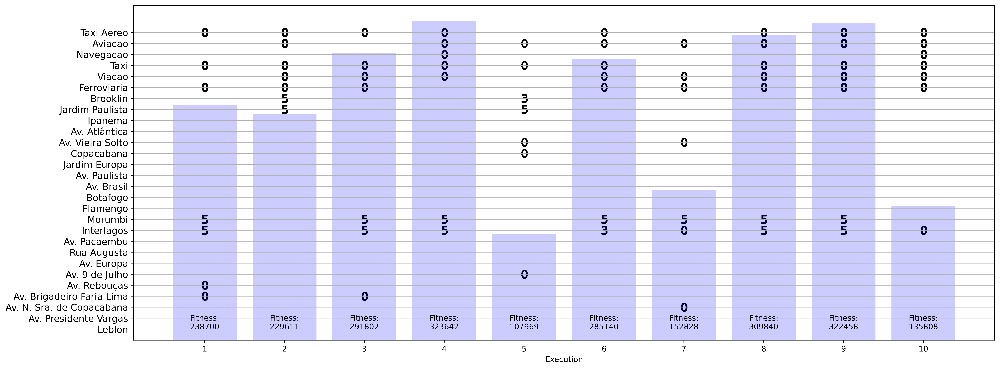

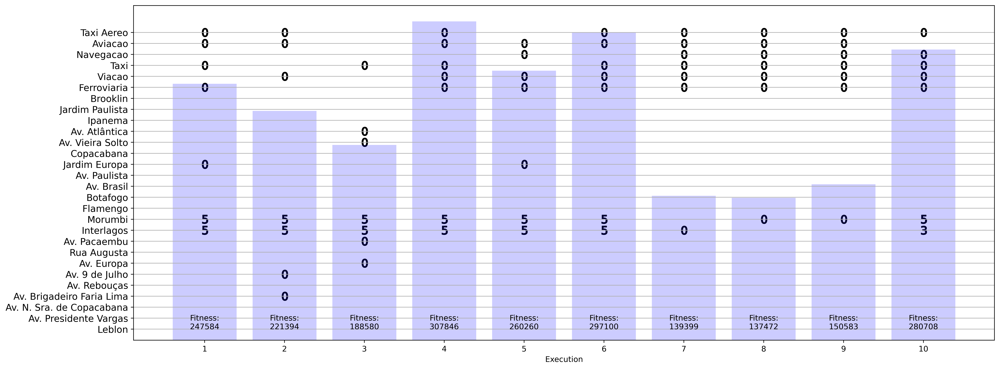

In [ ]:
print('Single point crossover')
results = []
for i in range(10):
  problem = Problem(Cards, seed=False)
  problem.InitializePopulation(10)
  avg_fitness, max_fitness, min_fitness, max_ind, gen, moves, fittests = problem.Search(max_generations=50, toprint=False, crossover_type=1)
  results.append( [max_fitness[-1], fittests[-1], gen] )
  print('Execution %d finished in generation %d' % (i, gen))
printResults(results)

print('Double point crossover')
results = []
for i in range(10):
  problem = Problem(Cards, seed=False)
  problem.InitializePopulation(10)
  avg_fitness, max_fitness, min_fitness, max_ind, gen, moves, fittests = problem.Search(max_generations=50, toprint=False, crossover_type=2)
  results.append( [max_fitness[-1], fittests[-1], gen] )
  print('Execution %d finished in generation %d' % (i, gen))
printResults(results)


By comparing the results for the fittest individual using single point (SP) crossover with the ones using double point (DP) crossover, a better consistency on the choice of properties for the single point is clear. Still, both presented a valid set of properties for a game, and the results were achieved on a similar number of generations (SP: 35/DP: 32.3) with DP being slightly faster. However, regarding the average fitness of the fittest individual, SP did better (SP: 239779.8/DP: 223092.6).


## Mutation Technique

Mutation adding one house
Execution 0 finished in generation 47
Execution 1 finished in generation 33
Execution 2 finished in generation 24
Execution 3 finished in generation 26
Execution 4 finished in generation 20
Execution 5 finished in generation 49
Execution 6 finished in generation 38
Execution 7 finished in generation 43
Execution 8 finished in generation 26
Execution 9 finished in generation 26
Fitness: 198638.30
Generation: 33.20
Mutation changing the number of houses randomly
Execution 0 finished in generation 20
Execution 1 finished in generation 37
Execution 2 finished in generation 17
Execution 3 finished in generation 16
Execution 4 finished in generation 39
Execution 5 finished in generation 37
Execution 6 finished in generation 50
Execution 7 finished in generation 28
Execution 8 finished in generation 21
Execution 9 finished in generation 14
Fitness: 227191.20
Generation: 27.90


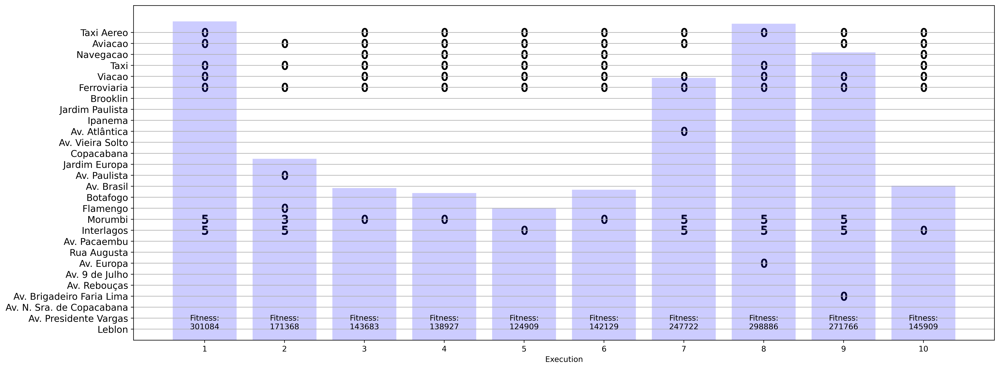

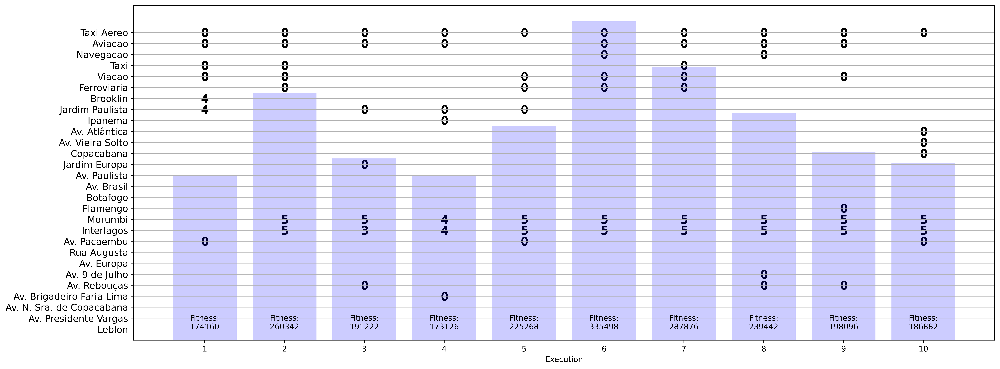

In [ ]:
print('Mutation adding one house')
results = []
for i in range(10):
  problem = Problem(Cards, seed=False)
  problem.InitializePopulation(10)
  avg_fitness, max_fitness, min_fitness, max_ind, gen, moves, fittests = problem.Search(max_generations=50, toprint=False, mutation_type=1)
  results.append( [max_fitness[-1], fittests[-1], gen] )
  print('Execution %d finished in generation %d' % (i, gen))
printResults(results)

print('Mutation changing the number of houses randomly')
results = []
for i in range(10):
  problem = Problem(Cards, seed=False)
  problem.InitializePopulation(10)
  avg_fitness, max_fitness, min_fitness, max_ind, gen, moves, fittests = problem.Search(max_generations=50, toprint=False, mutation_type=2)
  results.append( [max_fitness[-1], fittests[-1], gen] )
  print('Execution %d finished in generation %d' % (i, gen))
printResults(results)

Performing a random change (RC) in the number of houses resulted in a faster convergence than increasing one by one (ADD) (RC: 27.9 generations/ADD: 33.2 generations), as 5 houses could be placed at once on a property, what would significantly increase the fitness of the individual, and as seen in the second graph above (RC), almost all the results have properties with 5 houses on them and the properties are always Morumbi and Interlagos the ones with the most expensive rent.

## Replacement Method

Selecting the fittest among the population
Execution 0 finished in generation 36
Execution 1 finished in generation 29
Execution 2 finished in generation 24
Execution 3 finished in generation 40
Execution 4 finished in generation 49
Execution 5 finished in generation 30
Execution 6 finished in generation 47
Execution 7 finished in generation 20
Execution 8 finished in generation 30
Execution 9 finished in generation 50
Fitness: 228514.90
Generation: 35.50
Selecting some of the fittest among the population and adding some randomly
Execution 0 finished in generation 43
Execution 1 finished in generation 38
Execution 2 finished in generation 24
Execution 3 finished in generation 30
Execution 4 finished in generation 32
Execution 5 finished in generation 50
Execution 6 finished in generation 33
Execution 7 finished in generation 27
Execution 8 finished in generation 47
Execution 9 finished in generation 37
Fitness: 193284.50
Generation: 36.10


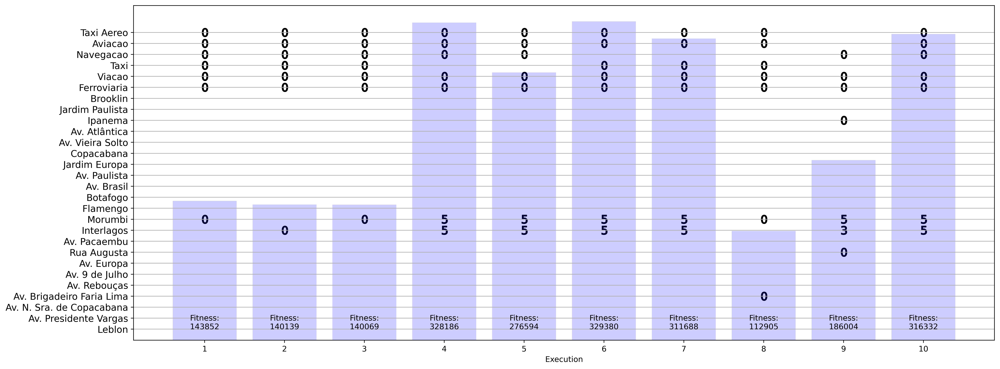

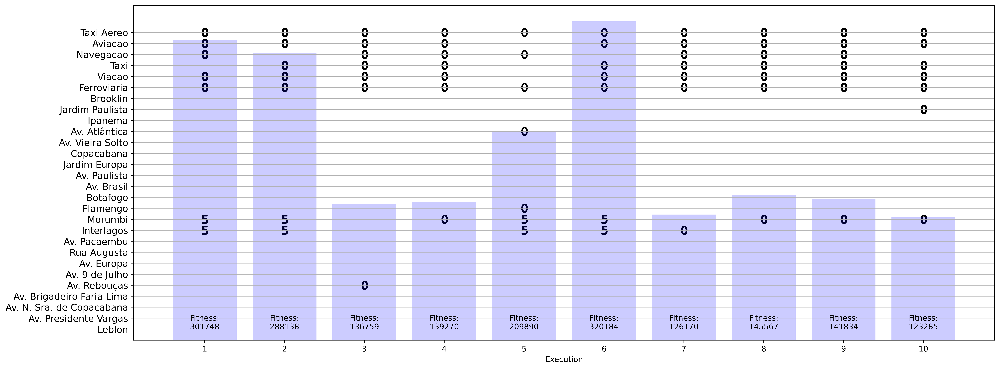

In [ ]:
# using replacement_type 1
print('Selecting the fittest among the population')
results = []
for i in range(10):
  problem = Problem(Cards, seed=False)
  problem.InitializePopulation(10)
  avg_fitness, max_fitness, min_fitness, max_ind, gen, moves, fittests = problem.Search(max_generations=50, toprint=False, replacement_type = 1)
  results.append( [max_fitness[-1], fittests[-1], gen] )
  print('Execution %d finished in generation %d' % (i, gen))

printResults(results)

print('Selecting some of the fittest among the population and adding some randomly')
# using replacement_type 2
results = []
for i in range(10):
  problem = Problem(Cards, seed=False)
  problem.InitializePopulation(10)
  avg_fitness, max_fitness, min_fitness, max_ind, gen, moves, fittests = problem.Search(max_generations=50, toprint=False, replacement_type = 2)
  results.append( [max_fitness[-1], fittests[-1], gen] )
  print('Execution %d finished in generation %d' % (i, gen))

printResults(results)

We tested two methods for replacement, the first one simply selecting the fittest elements, and in the second one 80% of the new population is composed of the fittest elements and the rest is randomly selected (remember that we are generating more individuals that we actually need in our crossover).

The idea of using the second implementation of replacement was to check if, with the crossover between very different fitness individuals, some part of the individual with a low fitness could stand out in another individual. For example, by forming a group of properties that was previously being ignored. However, the results showed little difference between the two methods, both in speed (generations) and fitness, with the first replacement being slightly better.

## Mutation Rate

Execution 0 finished in generation 23
Execution 1 finished in generation 11
Execution 2 finished in generation 15
Execution 3 finished in generation 11
Execution 4 finished in generation 39
Execution 5 finished in generation 50
Execution 6 finished in generation 33
Execution 7 finished in generation 17
Execution 8 finished in generation 15
Execution 9 finished in generation 46
Fitness: 117804.30
Generation: 26.00
Execution 0 finished in generation 38
Execution 1 finished in generation 34
Execution 2 finished in generation 24
Execution 3 finished in generation 36
Execution 4 finished in generation 24
Execution 5 finished in generation 29
Execution 6 finished in generation 23
Execution 7 finished in generation 26
Execution 8 finished in generation 30
Execution 9 finished in generation 27
Fitness: 214936.60
Generation: 29.10


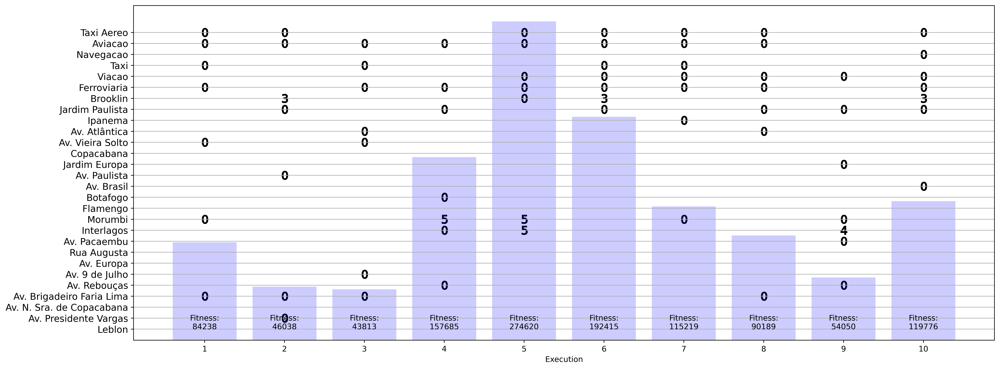

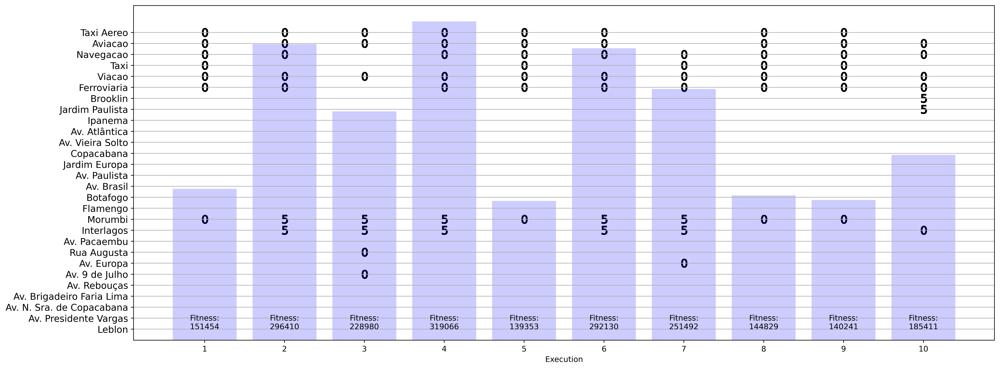

In [ ]:
results = []
for i in range(10):
  problem = Problem(Cards, seed=False)
  problem.InitializePopulation(10)
  avg_fitness, max_fitness, min_fitness, max_ind, gen, moves, fittests = problem.Search(max_generations=50, toprint=False, mutation_rate=0.1, crossover_rate=0.8)
  results.append( [max_fitness[-1], fittests[-1], gen] )
  print('Execution %d finished in generation %d' % (i, gen))
printResults(results)

results = []
for i in range(10):
  problem = Problem(Cards, seed=False)
  problem.InitializePopulation(10)
  avg_fitness, max_fitness, min_fitness, max_ind, gen, moves, fittests = problem.Search(max_generations=50, toprint=False, mutation_rate=0.8, crossover_rate=0.8)
  results.append( [max_fitness[-1], fittests[-1], gen] )
  print('Execution %d finished in generation %d' % (i, gen))
printResults(results)

We performed two tests with a mutation rate of 10% and 80%. A higher mutation rate required more generations than the lower rate (26.0 and 29.1), it was capable of nearly doubling the fitness achieved (117804.3 and 214936.6). This result clearly shows that our mutation method is a big influence on finding good results for our problem.

## Crossover Rate

Execution 0 finished in generation 18
Execution 1 finished in generation 13
Execution 2 finished in generation 14
Execution 3 finished in generation 23
Execution 4 finished in generation 47
Execution 5 finished in generation 12
Execution 6 finished in generation 23
Execution 7 finished in generation 41
Execution 8 finished in generation 17
Execution 9 finished in generation 18
Fitness: 182103.20
Generation: 22.60
Execution 0 finished in generation 36
Execution 1 finished in generation 38
Execution 2 finished in generation 19
Execution 3 finished in generation 28
Execution 4 finished in generation 16
Execution 5 finished in generation 36
Execution 6 finished in generation 33
Execution 7 finished in generation 15
Execution 8 finished in generation 35
Execution 9 finished in generation 28
Fitness: 213816.20
Generation: 28.40


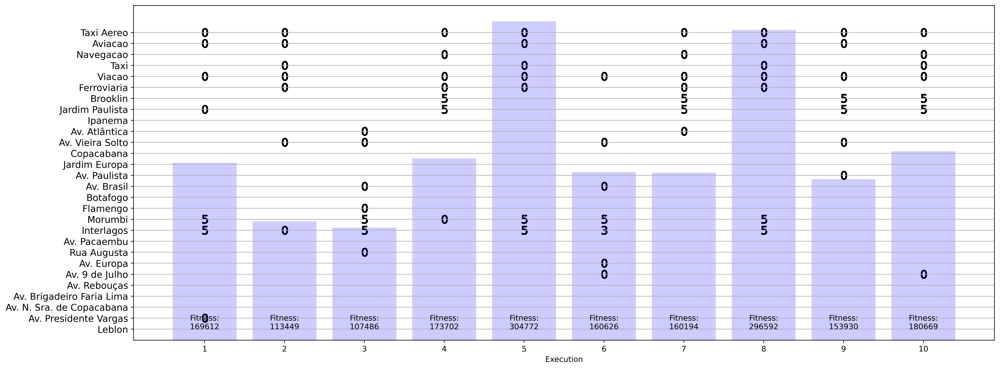

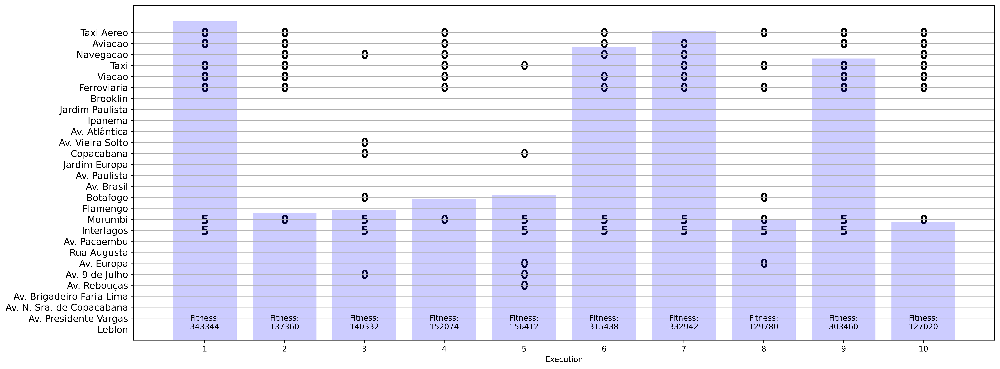

In [ ]:
results = []
for i in range(10):
  problem = Problem(Cards, seed=False)
  problem.InitializePopulation(10)
  avg_fitness, max_fitness, min_fitness, max_ind, gen, moves, fittests = problem.Search(max_generations=50, toprint=False, mutation_rate=0.8, crossover_rate=0.2)
  results.append( [max_fitness[-1], fittests[-1], gen] )
  print('Execution %d finished in generation %d' % (i, gen))
printResults(results)

results = []
for i in range(10):
  problem = Problem(Cards, seed=False)
  problem.InitializePopulation(10)
  avg_fitness, max_fitness, min_fitness, max_ind, gen, moves, fittests = problem.Search(max_generations=50, toprint=False, mutation_rate=0.8, crossover_rate=0.8)
  results.append( [max_fitness[-1], fittests[-1], gen] )
  print('Execution %d finished in generation %d' % (i, gen))
printResults(results)

We performed two tests with a crossover rate of 20% and 80%. Although a higher crossover rate required more generations  than the lower rate (22.6 and 28.4), it also achieved better results (182103.2 and 213816.2 fitness)

# References

[1] Shanklin, S.B. and Ehlen, C.R., 2007. Using the Monopoly board game as an in-class economic simulation in the Introductory Financial Accounting course. Journal of College Teaching & Learning (TLC), 4(11).

[2] O'Halloran, R. and Deale, C., 2010. Designing a Game Based on Monopoly as a Learning Tool for lodging development. Journal of Hospitality & Tourism Education, 22(3), pp.35-48.

[3] Hastunar, D.E., Bharati, D.A.L. and Sutopo, D., 2014. Modifying a Monopoly Game for Teaching Written Vocabulary for the Seventh Graders of Terang Bangsa Junior High School. English Education Journal, 4(2).

[4] Loffredo, N., 2008. Agent Based Simulation, Negotiation, and Strategy Optimization of Monopoly. Computer Systems Lab Senior Research Projects 2007-2008 2nd Quarter vers., p.83.

[5] Yasumura, Y., Oguchi, K. and Nitta, K., 2001, July. Negotiation strategy of agents in the Monopoly game. In Proceedings 2001 IEEE International Symposium on Computational Intelligence in Robotics and Automation (Cat. No. 01EX515) (pp. 277-281). IEEE.

[6] Hickey, W., 2013. How to use math to crush your friends 
at Monopoly like you've never done before. Business Insider. Available online: https://www.businessinsider.com/math-monopoly-statistics-2013-6. Last acessed: June 21st, 2020.